In [1]:
# initial setup
try:
    # settings colab:
    import google.colab
    
    # si usan colab, deben cambiar el token de esta url
    #! mkdir -p ../data
    # los que usan colab deben modificar el token de esta url:
    #! wget -O ../data/properati_2017.csv https://raw.githubusercontent.com/Digital-House-DATA/ds_blend_students_2020/master/M2/CLASE_07_Pandas_2/Data/resultado-de-encuestas-2017-2018.csv?token=AA4GFHO3EKGWGILBCV4BISC6WR6B4
    
except ModuleNotFoundError:    
    # settings local:
    %run "common/base_setup.py"

Running command `conda list`... ok
pandas=1.0.3 already installed
matplotlib=2.2.2 already installed
bokeh=2.0.0 already installed
seaborn=0.10.0 already installed
ipywidgets=7.5.1 already installed
pytest=5.3.4 already installed
chardet=3.0.4 already installed
plotly=4.6.0 already installed
Running command `conda install --yes chart-studio=1.1.0`... error
    
PackagesNotFoundError: The following packages are not available from current channels:

  - chart-studio=1.1.0

Current channels:

  - https://repo.anaconda.com/pkgs/main/linux-64
  - https://repo.anaconda.com/pkgs/main/noarch
  - https://repo.anaconda.com/pkgs/r/linux-64
  - https://repo.anaconda.com/pkgs/r/noarch

To search for alternate channels that may provide the conda package you're
looking for, navigate to

    https://anaconda.org

and use the search bar at the top of the page.





## Carga Inicial del Dataset

In [80]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0)
import seaborn as sns

In [81]:
# low_memorybool, default True
# Internally process the file in chunks, resulting in lower memory use while parsing, 
# but possibly mixed type inference. To ensure no mixed types either set False, 
# or specify the type with the dtype parameter. 
# Note that the entire file is read into a single DataFrame regardless, 
# use the chunksize or iterator parameter to return the data in chunks. (Only valid with C parser).
data = pd.read_csv("./data/properati-fase4.csv", sep = ",", low_memory=False)
data.shape

(75298, 39)

Vemos que vamos a trabajar con 75298 registros.

A continuación, haremos algunas manipulaciones básicas para terminar de acomodar el dataset.

In [82]:
# completamos las variables categóricas
data["operation"] = data["operation"].astype('category')

# eliminamos columnas que son transformaciones lineales o que tienen un solo valor
data.drop([
    'index',
    'place_with_parent_names',
    'country_name',
    'state_name',
    'place_name',
    'geonames_id',
    'lat',
    'lon',
    'price',
    'currency',
    'precio_ars',
    'precio_usd',
    'place_with_parent_names',
    'precio_m2_ars',
    'gn_lat',
    'gn_lon',
    'operation',
    'description',
    'title',
    'c_pais',
], axis=1, inplace=True)

Evaluamos los stores dado que la venta de un fondo de comercio no implica necesariamente la venta de un inmuble.

In [83]:
stores = data[data['property_type'] == 'store']
stores.describe()

,id,superficie_total,superficie_cubierta,precio_m2_usd,floor,rooms,c_lat,c_lng,pileta,parrilla,quincho,patio,cochera,balcon,amenities,dist_subte
count,1809.000000,1809.000000,1539.000000,1809.000000,434.000000,145.000000,1702.000000,1702.000000,1809.000000,1809.000000,1809.000000,1809.000000,1809.000000,1809.000000,1809.000000,1800.000000
mean,60264.574350,162.568431,116.483431,1724.828449,0.294931,2.682759,-34.714475,-59.569544,0.027087,0.044776,0.013267,0.156993,0.088447,0.038695,0.369265,0.286310
std,32856.462239,121.468219,105.054708,1015.459028,2.615573,1.888207,2.020530,2.947310,0.162381,0.206869,0.114447,0.363895,0.284022,0.192921,0.744943,0.677502
min,204.000000,8.906115,2.000000,66.676335,0.000000,1.000000,-53.768341,-71.354672,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,33413.000000,50.000000,31.000000,935.135595,0.000000,1.000000,-34.656527,-58.685960,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,61388.000000,130.000000,80.000000,1550.000000,0.000000,2.000000,-34.601969,-58.456686,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,86519.000000,260.000000,176.000000,2400.000000,0.000000,3.000000,-34.535104,-58.391920,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.311541
max,121125.000000,433.000000,605.000000,4335.260116,53.000000,11.000000,-26.785220,-56.676951,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,5.460860


Del resumen, obtenemos que el precio promedio por m2 es de alrededor usd1700 y hay una gran dispersión de más de usd1000 lo cuál puede deberse al valor intrinseco de cada fondo de comercio.

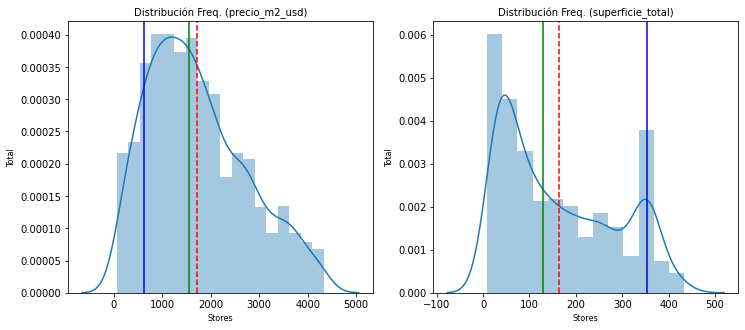

In [84]:
_, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))
precio_mean   = stores['precio_m2_usd'].mean()
precio_median = stores['precio_m2_usd'].median()
precio_mode   = stores['precio_m2_usd'].mode().values[0]
sns.distplot(stores['precio_m2_usd'], hist=True, ax=axes[0])
axes[0].set_title('Distribución Freq. (precio_m2_usd)', fontsize=10)
axes[0].set_xlabel('Stores', fontsize=8)
axes[0].set_ylabel('Total', fontsize=8)
axes[0].axvline(precio_mean,   color='r', linestyle='--')
axes[0].axvline(precio_median, color='g', linestyle='-')
axes[0].axvline(precio_mode,   color='b', linestyle='-')
sup_mean   = stores['superficie_total'].mean()
sup_median = stores['superficie_total'].median()
sup_mode   = stores['superficie_total'].mode().values[0]
sns.distplot(stores['superficie_total'], hist=True, ax=axes[1])
axes[1].set_title('Distribución Freq. (superficie_total)', fontsize=10)
axes[1].set_xlabel('Stores', fontsize=8)
axes[1].set_ylabel('Total', fontsize=8)
axes[1].axvline(sup_mean,   color='r', linestyle='--')
axes[1].axvline(sup_median, color='g', linestyle='-')
axes[1].axvline(sup_mode,   color='b', linestyle='-')
plt.show()

Vemos que las medidas centrales respecto del precio se acumulan entre usd1000 y usd2000 y respecto de la superficie total, el grueso tiene menos de 100m, lo cual tiene sentido dado que la mayoría de estos anuncios son locales destinados a montar un comercio.

Para realizar nuestros estudio, decidimos prescindir de ellos.

In [85]:
data = data[data['property_type'] != 'store']

## Exploración

Vamos a crear una nueva variable *grupo* para agrupar las ocurrencias y manejar grupos de registros no tan pequeños:

In [86]:
counts = data.groupby('c_estado').size()
groups = [name for name, value in counts.items() if value > 999]
data['grupo'] = [value if value in groups else 'Otros' for value in data['c_estado']]
data['grupo'] = data['grupo'].astype('category')

observaciones = data.groupby('grupo').size().sort_values(ascending=False)
observaciones

grupo
Capital Federal                 23857
Bs.As. G.B.A. Zona Norte        16825
Bs.As. G.B.A. Zona Sur           7089
Buenos Aires Costa Atlántica     6841
Bs.As. G.B.A. Zona Oeste         6073
Córdoba                          5061
Santa Fe                         4705
Otros                            2017
Buenos Aires Interior            1021
dtype: int64

### Bars de frecuencias por grupo
Claramente, el distrito con más anuncios es Buenos Aires. 

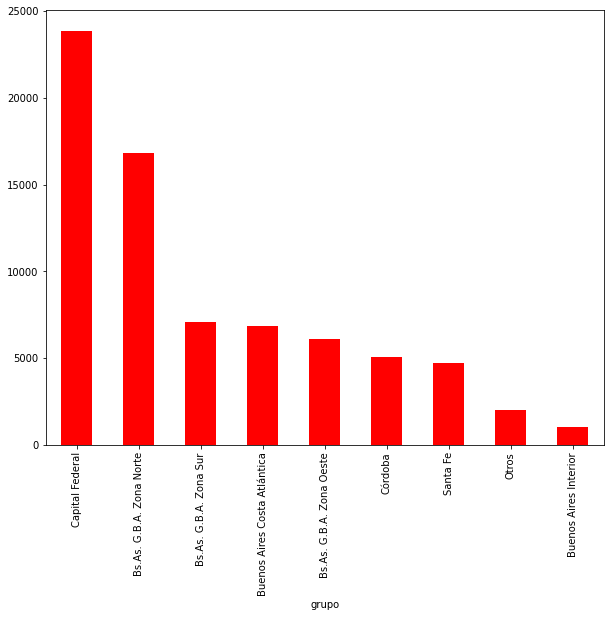

In [87]:
observaciones.plot(kind='bar', color='red')

Podemos apreciar la misma conclusión con el siguiente gráfico de torta, sólo que en este caso habría que juntar los colores correspondientes a los distintos grupos de Buenos Aires.

Text(0.5, 1.0, 'Propiedades en venta por Grupo/Región')

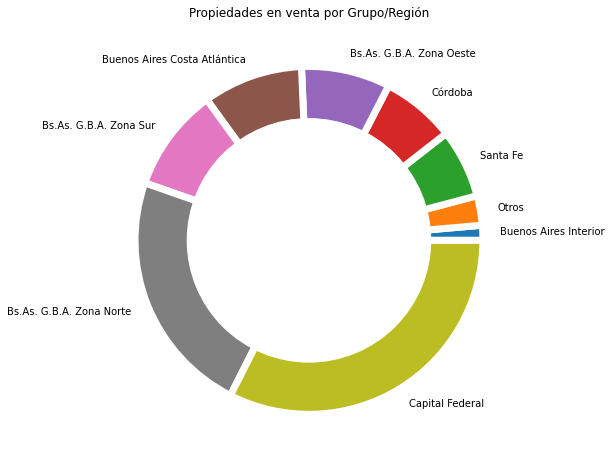

In [88]:
regiones     = pd.Series(data['grupo'].value_counts().sort_values(ascending=True))
region_graph = pd.DataFrame(regiones)
region_graph['Cantidad'] = region_graph['grupo']
region_graph = region_graph.drop(labels='grupo', axis=1)

names = region_graph.index

fig = plt.figure()
fig.patch.set_facecolor("white")
plt.rcParams["text.color"] = "black"

my_circle=plt.Circle( (0,0), 0.7, color="white")
plt.pie(region_graph["Cantidad"], labels=names,
        wedgeprops = { 'linewidth' : 7, 'edgecolor' : 'white' })

my_circle=plt.Circle( (0,0), 0.7, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title("Propiedades en venta por Grupo/Región")

### Violin de superficie total por tipo de propiedad
Vemos que los departamentos están nucleados en una superficie inferior a los 100m2, los PH pueden llegar hasta 200m2, mientras que las casas se distribuyen de forma homogénea hasta poco más de 400m2. 

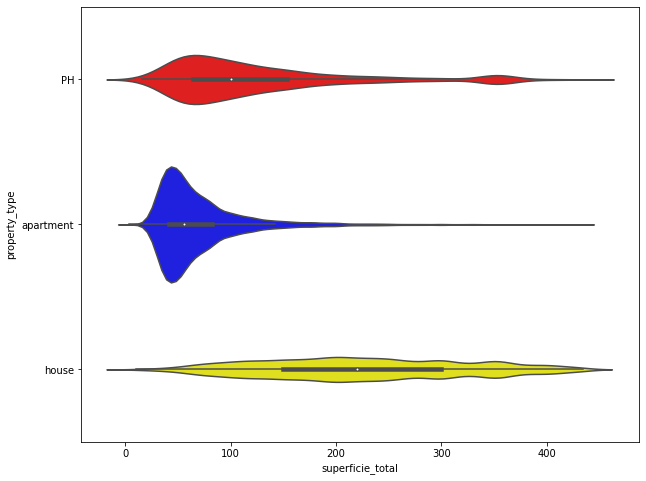

In [89]:
sns.violinplot("superficie_total", "property_type", data=data, palette=["red", "blue", "yellow"])

### Violin de precio por m2 por tipo de propiedad
Acá vemos que el valor por m2 de un departamento suele ser más caro de los 3 tipos, seguido de los PH y por último las casas.

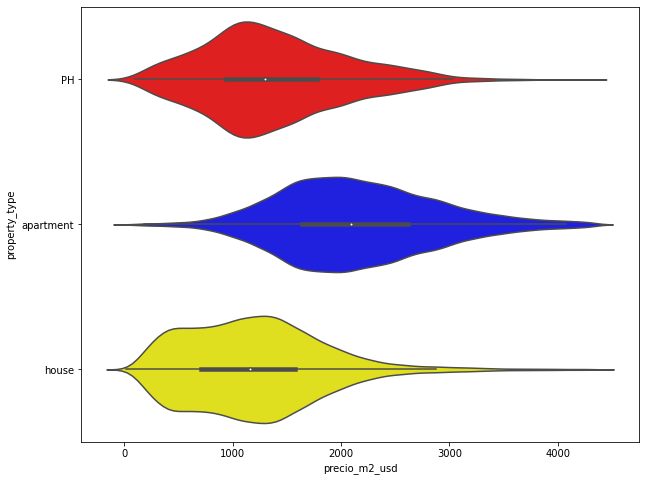

In [90]:
sns.violinplot("precio_m2_usd", "property_type", data=data, palette=["red", "blue", "yellow"])

Agregamos la pileta a lo anterior y podemos concluir por lo general (para PH no es tan claro en este caso) una propiedad con pileta tiende a cotizar más el m2.

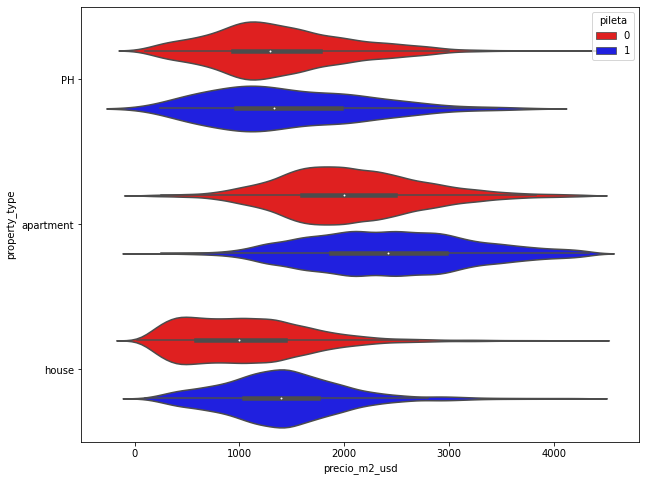

In [91]:
sns.violinplot("precio_m2_usd", "property_type", hue="pileta", data=data, palette=["red", "blue", "yellow"])

### Mediana de amenities/ambientes por grupo

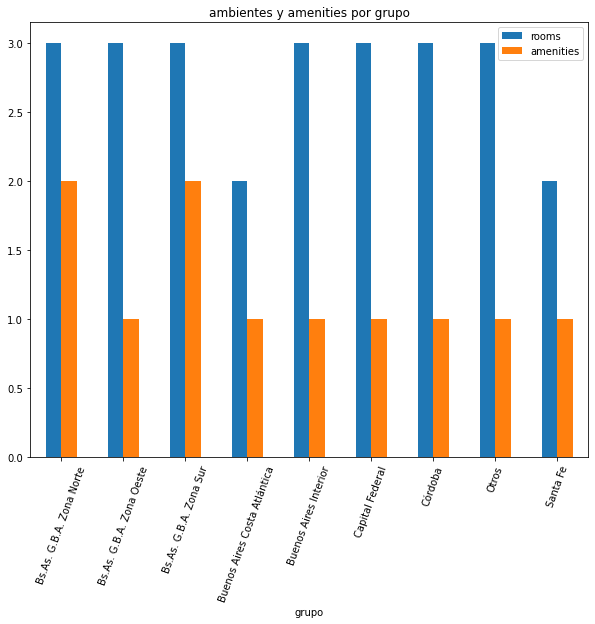

In [92]:
data_group_state = data.groupby('grupo')
media_state      = data_group_state.median()
media_state_filt = media_state.loc[media_state.index.isin(list(data['grupo'].unique()))]

media_state_filt.plot.bar(rot=70 ,y=['rooms','amenities'], title ="ambientes y amenities por grupo")

### Mediana de precio m2 por grupo

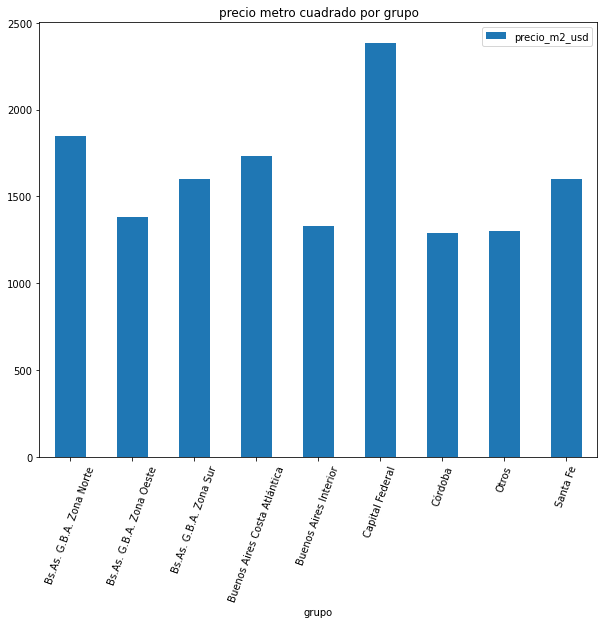

In [93]:
media_state_filt.plot.bar(rot=70 ,y="precio_m2_usd", title="precio metro cuadrado por grupo")

### Mediana de superficie total por grupo

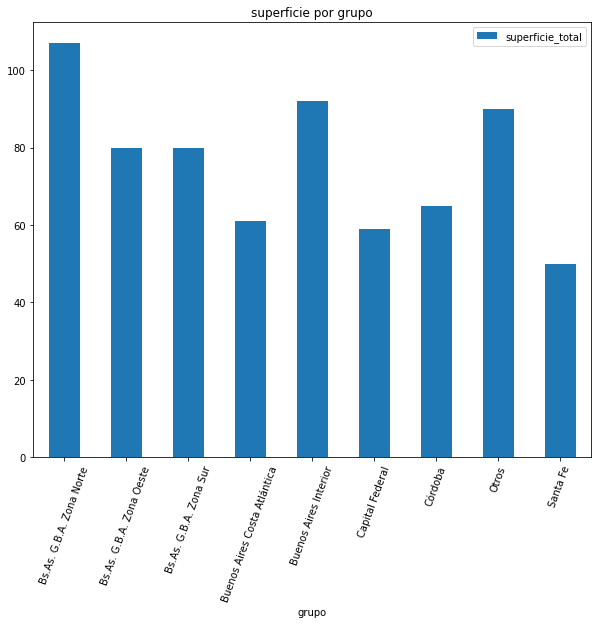

In [94]:
media_state_filt.plot.bar(rot=70 ,y="superficie_total", title="superficie por grupo")

### Gráficos extras

In [95]:
import plotly.express as px
fig = px.scatter(data_frame=data, x="amenities", y="precio_m2_usd", color="property_type", opacity=0.6)
fig.show()

In [96]:
fig = px.scatter(data_frame=data, x="grupo", y="precio_m2_usd", color="property_type", opacity=0.6)
fig.show()

### Amenities Binarios

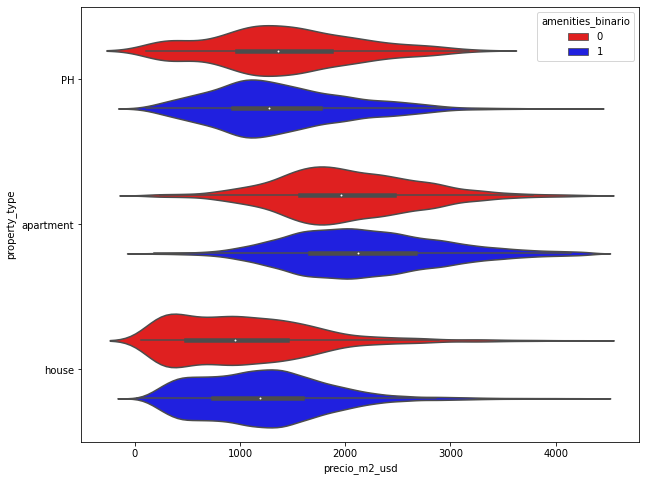

In [97]:
data['amenities_binario'] = data["amenities"] != 0 
data['amenities_binario'] = data['amenities_binario'].astype(np.int)
sns.violinplot(
    "precio_m2_usd",
    "property_type",
    hue="amenities_binario",
    data=data,
    palette=["red", "blue", "yellow"])

## Búsqueda de Correlaciones

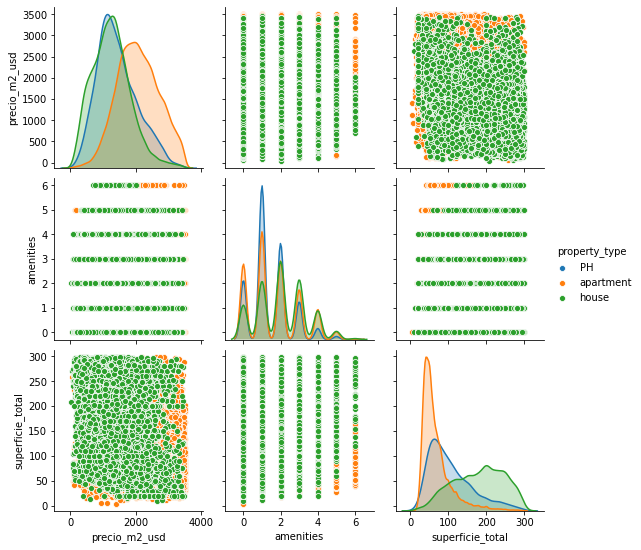

In [98]:
mask_graph = (data.precio_m2_usd < 3500) & (data.superficie_total < 300) 
sns.pairplot(
    data[mask_graph],
    vars=['precio_m2_usd', 'amenities', 'superficie_total'],
    hue='property_type',
    height=2.5)

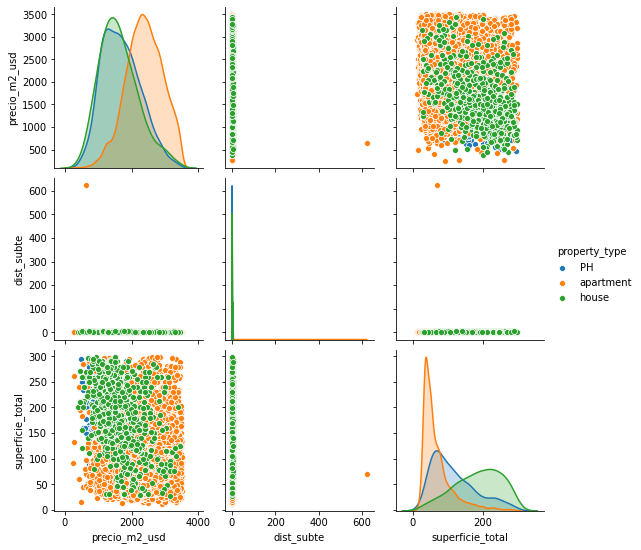

In [99]:
subtes_mask = (data['dist_subte'] > 0) & mask_graph
sns.pairplot(
    data[subtes_mask],
    vars=['precio_m2_usd','dist_subte','superficie_total'],
    hue='property_type',
    height=2.5)

## Estadística descriptiva
Finalmente, esbozamos el resumen estadístico del dataset que usaremos para hacer la regresión como parte del **próximo desafío**.

In [100]:
data.describe()

,id,superficie_total,superficie_cubierta,precio_m2_usd,floor,rooms,c_lat,c_lng,pileta,parrilla,quincho,patio,cochera,balcon,amenities,dist_subte,amenities_binario
count,73489.000000,73489.000000,68966.000000,73489.000000,20284.000000,47971.000000,68255.000000,68255.000000,73489.000000,73489.000000,73489.000000,73489.000000,73489.000000,73489.000000,73489.000000,73203.000000,73489.000000
mean,59513.312319,109.689396,92.121878,1897.609548,5.550187,3.337245,-34.528202,-59.207117,0.261440,0.316632,0.075453,0.281049,0.430078,0.424649,1.789302,0.304318,0.812571
std,34477.757247,91.663091,267.438957,820.128784,64.278564,94.348232,1.809954,2.139903,0.439422,0.465166,0.264123,0.449514,0.495090,0.494293,1.348082,2.411425,0.390259
min,0.000000,4.000000,0.000000,19.050136,0.000000,1.000000,-54.819736,-72.276820,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,30267.000000,47.000000,43.000000,1333.333333,0.000000,2.000000,-34.651390,-58.694218,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
50%,59041.000000,70.000000,63.000000,1850.761200,0.000000,3.000000,-34.589172,-58.487030,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1.000000
75%,89220.000000,140.000000,110.000000,2427.600000,2.000000,3.000000,-34.431325,-58.404280,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,3.000000,0.259531,1.000000
max,121219.000000,434.000000,49000.000000,4341.463415,2509.000000,20174.000000,-23.137164,-54.343870,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,6.000000,622.811786,1.000000


In [101]:
data.to_csv('./data/properati-fase5.csv', sep=',', index=False)